In [204]:
library('ggplot2')
library('reshape2')
library('ggpubr')
library(glmnet)
library(doMC)
library(survival)
library(data.table)
library(mltools)
library(CoxBoost)
library(randomForestSRC)
library(CoxHD)
library(Hmisc)
library(gridExtra)
library("survminer")
library(dplyr)
library(stringr)
library(survminer)
library(tidyr)
library(cmprsk)
options(warn=-1)
source("../../../../src/tools.R")
source("../../../script_figures/tools.R")
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 250, # set the maximum number of rows displayed
        repr.matrix.max.cols = 250) # set the maximum number of columns displayed

# PC1 + PC2 ANALYSIS

In [207]:
tmp <-read.table('../handovercompiled.Yanis.080919.csv',sep=",",header=T)
rownames(tmp) <- tmp$data_pd
cols_to_keep <- colnames(tmp)
master <- read.table('../../../../data/initial_dataset/Master_04_10_2019.csv',sep=",",header=T)
rownames(master) <- master$data_pd
df <- read.table('../../../clustering/clustering_Final_1/df_final_full_component.tsv')
df_merge_post_course <- merge(df,master[,c(cols_to_keep,"intense")],by=0)
rownames(df_merge_post_course) <- df_merge_post_course$Row.names
df_merge_post_course <- df_merge_post_course[-1]
df_merge_post_course$AMLID <- as.character(df_merge_post_course$AMLID)
df_merge_post_course$MRD1 <- as.character(df_merge_post_course$MRD1)
df_merge_post_course$MRD2 <- as.character(df_merge_post_course$MRD2)
df_merge_post_course <- df_merge_post_course[grep("17-", df_merge_post_course$AMLID),]   ### keep only AML 17

df_merge_post_course$CR_MRD_neg_pc1 <- ifelse(df_merge_post_course$MRD1=="CR,MRD-",1,0)
df_merge_post_course[is.na(df_merge_post_course$CR_MRD_neg_pc1),"CR_MRD_neg_pc1"] <- 0
df_merge_post_course$CR_MRD_pos_pc1 <- ifelse(df_merge_post_course$MRD1=="CR,MRD+",1,0)
df_merge_post_course[is.na(df_merge_post_course$CR_MRD_pos_pc1),"CR_MRD_pos_pc1"] <- 0
df_merge_post_course$all_others_pc1 <- ifelse((df_merge_post_course$CR_MRD_neg_pc1==0 & df_merge_post_course$CR_MRD_pos_pc1==0),1,0)

df_merge_post_course$CR_MRD_neg_pc2 <- ifelse(df_merge_post_course$MRD2=="CR,MRD-",1,0)
df_merge_post_course[is.na(df_merge_post_course$CR_MRD_neg_pc2),"CR_MRD_neg_pc2"] <- 0
df_merge_post_course$CR_MRD_pos_pc2 <- ifelse(df_merge_post_course$MRD2=="CR,MRD+",1,0)
df_merge_post_course[is.na(df_merge_post_course$CR_MRD_pos_pc2),"CR_MRD_pos_pc2"] <- 0
df_merge_post_course$all_others_pc2 <- ifelse((df_merge_post_course$CR_MRD_neg_pc2==0 & df_merge_post_course$CR_MRD_pos_pc2==0),1,0)

df_merge_post_course <- df_merge_post_course[!is.na(df_merge_post_course$OS_CR),]
df_merge_post_course <- df_merge_post_course[!is.na(df_merge_post_course$MRD1),]   ## we do it based on MRD1 to have exactly same patients in the comparison post course 1 vs post course 2 study!!!
df_merge_post_course <- df_merge_post_course[df_merge_post_course$os >0 & df_merge_post_course$OS_CR >0 & df_merge_post_course$RFSyears>0,]

genes <- colnames(df_merge_post_course[,c(5:88)])

cytos <- colnames(df_merge_post_course[,c(89:158)])

eln <- colnames(df_merge_post_course[,c(2,3,4)])
comp <- colnames(df_merge_post_course[,c(170:186)])

all_gen <- c(5:88)
vect <- apply(X=df_merge_post_course[,all_gen],2,FUN=function(x) 100*length(which(x==1))/dim(df_merge_post_course)[1])
gen <- colnames(df_merge_post_course[,match(names(vect[vect>=2]),names(df_merge_post_course))])

all_cyto <- c(89:158)
vect <- apply(X=df_merge_post_course[,all_cyto],2,FUN=function(x) 100*length(which(x==1))/dim(df_merge_post_course)[1])
cyto <- colnames(df_merge_post_course[,match(names(vect[vect>=2]),names(df_merge_post_course))])

clin <- colnames(df_merge_post_course[,c(159:165)])
demo <- colnames(df_merge_post_course[,c(166:167)])

# Cox Model

In [211]:
normalized<-function(y) {

  x<-y[!is.na(y)]

  x<-(x - min(x)) / (max(x) - min(x))

  y[!is.na(y)]<-x

  return(y)
  }

In [247]:
tmp <- df_merge_post_course

tmp$gender <- factor(tmp$gender,labels=c("Female","Male"))
tmp$ahd <- factor(tmp$ahd,labels=c("no","yes"))
tmp$perf_status <- factor(tmp$perf_status,labels=c("Fully active","Restricted physical act","selfcare but no work activities","limited selfcare"))
tmp$secondary <- factor(tmp$secondary,labels=c(1,2,3))
tmp$MRD_Status <- factor(ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_neg_pc2==1 ,"neg1_neg2",
                            ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_pos_pc2==1 ,"neg1_pos2",
                                  ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_neg_pc2==1 ,"pos1_neg2",
                                        ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_pos_pc2==1 ,"pos1_pos2","all_others")))))
tmp$MRD_Status_pc1 <- (ifelse(tmp$CR_MRD_neg_pc1==1,"CR_MRD_neg_pc1",
                            ifelse(tmp$CR_MRD_pos_pc1==1,"CR_MRD_pos_pc1","all_others_pc1")))
tmp$MRD_Status_pc2 <- (ifelse(tmp$CR_MRD_neg_pc2==1,"CR_MRD_neg_pc2",
                            ifelse(tmp$CR_MRD_pos_pc2==1,"CR_MRD_pos_pc2","all_others_pc2")))

tmp[,c("age","bm_blasts","wbc","hb","plt")] <- apply(tmp[,c("age","bm_blasts","wbc","hb","plt")],2,normalized)

set.seed(123)
covariates <- c("CR_MRD_neg_pc1","CR_MRD_pos_pc2",clin,demo)
form <- "Surv(RFSyears, RFSStatus) ~ "
for (co in covariates){
    form <- paste (form,co,sep = " + ")
}
l <- coxph(as.formula(form), data = tmp, method = "breslow")
summary(l)$concordance[1]
# data_trans <- list()
# cox_trans <- list()
# plot_forest <- list()
# for (i in c(1:5)){
#     data_trans[[i]] <- msdata_precomputed[msdata_precomputed$trans==i,]
#     formula <- ifelse(i!=4,form,gsub("full_component_t_15_17 \\+","",form))   ## Handle comp t(15,17) for trans 4 because otherwise ggforest do not work!
#     cox_trans[[i]] <- coxph(as.formula(formula), data = data_trans[[i]], method = "breslow")
#     title <- ifelse(i==1,"Alive --> Alive in CR",
#                    ifelse(i==2,"Alive --> Death Without CR",
#                          ifelse(i==3,"Alive in CR -->Alive with Relapse",
#                                ifelse(i==4,"Alive in CR --> Death in CR","Alive with Relapse --> Death With Relapse"))))
#     plot_forest[[i]] <- ggforest(cox_trans[[i]],main=paste("Hazard ratio for ",title),fontsize=1)
# }

C 
0.6150869

Call:
coxph(formula = as.formula(form), data = tmp, method = "breslow")

                                               coef exp(coef) se(coef)      z
CR_MRD_neg_pc1                             -0.46567   0.62772  0.12970 -3.590
CR_MRD_pos_pc2                              0.26568   1.30431  0.12859  2.066
ahdyes                                     -0.87924   0.41510  0.41163 -2.136
perf_statusRestricted physical act         -0.10534   0.90002  0.11176 -0.943
perf_statusselfcare but no work activities -0.18440   0.83160  0.28875 -0.639
perf_statuslimited selfcare                -0.05903   0.94267  0.36191 -0.163
bm_blasts                                  -0.21336   0.80787  0.20578 -1.037
secondary2                                 -0.25107   0.77797  0.34290 -0.732
secondary3                                  0.56841   1.76546  0.24711  2.300
wbc                                         1.39851   4.04918  0.32051  4.363
hb                                          0.43522   1.54530  0.3125

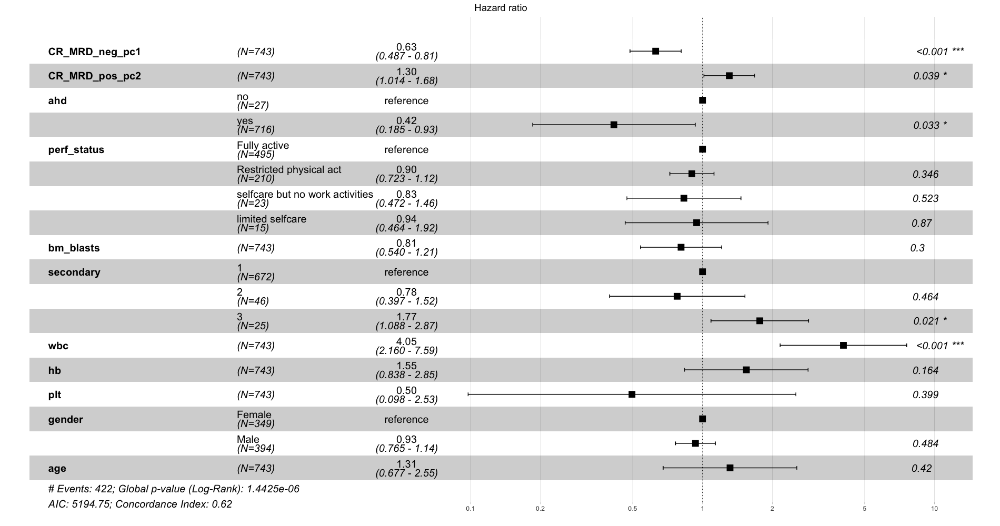

In [248]:
set_notebook_plot_size(19,10)
l
ggforest(l,fontsize=1.3)
# l
# l

# Cumulative Incidence Function Post Course

In [15]:
dd_post_course <- df_merge_post_course
dd_post_course$comp_sample_years = dd_post_course$RFSyears
dd_post_course$comp_status = "censor"
dd_post_course$comp_status[dd_post_course$RelapseCIStatus==1] = "relapse"
dd_post_course$comp_status[dd_post_course$RelapseCIStatus==2] = "death"
dd_post_course$comp_status = factor(dd_post_course$comp_status, levels=c("censor","relapse","death"))
table(dd_post_course$comp_status)


gg_competingrisks.cuminc <- function(fit, gnames = NULL, gsep=" ",
                                    coef = 1.96, conf.int = FALSE, line.size=4, group.levels=NULL,title="Relapse risk") {
    
  # -- fit is from cuminc --  #
  if (!is.null(fit$Tests))
    fit <- fit[names(fit) != "Tests"]
  fit2 <- lapply(fit, `[`, 1:3)
  if (is.null(gnames)) gnames <- names(fit2)
  fit2_list <- lapply(seq_along(gnames), function(ind) {
    df <- as.data.frame(fit2[[ind]])
    df$name <- gnames[ind]
    df
  })
  time <- est <- event <- group <- NULL
  df <- do.call(rbind, fit2_list)
  df$event <- sapply(strsplit(df$name, split=gsep), `[`, 2)
  df$group <- sapply(strsplit(df$name, split=gsep), `[`, 1)
  df$std <- std <- sqrt(df$var)
  if (!is.na(group.levels)) {
      df$group = factor(df$group, levels=group.levels)
  }

  df <- df[df$event=="relapse",]

  pl <-  ggplot(df, aes(time, est, color=group)) + geom_line(size=line.size,linetype=1) + ylab("Cumulative incidence") + xlab("Time (years)") + theme_survminer() + ggtitle(title)

  if (conf.int) {
    pl <- pl + geom_ribbon(aes(ymin = est - coef*std, ymax=est + coef*std, fill = event), alpha = 0.2, linetype=0)
  }

  return(pl)
}



 censor relapse   death 
    321     338      84 

# MRD STATUS FOR NPM1

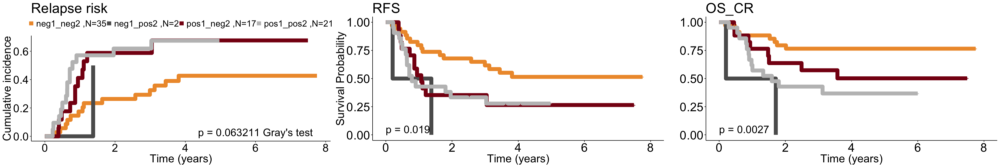

In [29]:
tmp <- df_merge_post_course[df_merge_post_course$NPM1==1,]
tmp$comparison <- ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_neg_pc2==1, "neg1_neg2",
                         ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_pos_pc2==1, "neg1_pos2",
                                    ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_neg_pc2==1, "pos1_neg2",
                                           ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_pos_pc2==1, "pos1_pos2",
                                                                         "others"))))
tmp <- tmp[tmp$comparison!="others",]
tmp$comparison <- factor(tmp$comparison,levels=c("neg1_neg2","neg1_pos2","pos1_neg2","pos1_pos2"))
p <- list()
for (i in 1:2){
    if (i==1){
        surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
    }  else {  
        surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)
        }
                    
                          
    fit <- survfit(surv_object ~ comparison, data = tmp)
    p[[i]] <- plot_surv_curves(fit,
                               y=ifelse(i==1,"Survival Probability",""),submain=ifelse(i==1,"RFS","OS_CR"),font.legend=16,vals = val,legend="none") 
}


tmp = dd_post_course[dd_post_course$NPM1==1,]
tmp$comparison <- ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_neg_pc2==1, "neg1_neg2",
                         ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_pos_pc2==1, "neg1_pos2",
                                    ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_neg_pc2==1, "pos1_neg2",
                                           ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_pos_pc2==1, "pos1_pos2",
                                                                         "others"))))
tmp <- tmp[tmp$comparison!="others",]
tmp$comparison <- factor(tmp$comparison,levels=c("neg1_neg2","neg1_pos2","pos1_neg2","pos1_pos2"))
cmfit = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
tlg = table(tmp$comparison[!is.na(tmp$comp_sample_years)])
myleg = paste0(" ", names(tlg)," ,N=",tlg,"")

cmfit.test = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
pval = cmfit.test$Tests["relapse","pv"]

cr <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=c("neg1_neg2","neg1_pos2","pos1_neg2","pos1_pos2"))+scale_color_manual(values=val,labels=myleg)+
theme(legend.key.width = unit(0.1,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
      plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=19))+
      theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,6),"Gray's test"),x=6,y=0.03,size=8)
set_notebook_plot_size(30,5)
grid.arrange(cr,p[[1]]$plot,p[[2]]$plot,nrow=1)

# MRD STATUS INTERACTION PC1-PC2

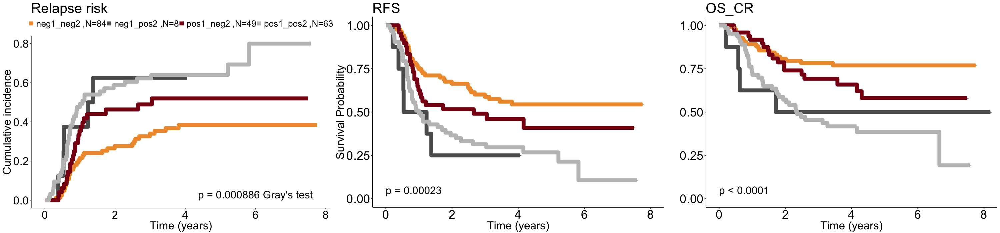

In [178]:
tmp$comparison <- ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_neg_pc2==1, "neg1_neg2",
                         ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_pos_pc2==1, "neg1_pos2",
                                    ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_neg_pc2==1, "pos1_neg2",
                                           ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_pos_pc2==1, "pos1_pos2",
                                                                         "others"))))
tmp <- tmp[tmp$comparison!="others",]
tmp$comparison <- factor(tmp$comparison,levels=c("neg1_neg2","neg1_pos2","pos1_neg2","pos1_pos2"))
p <- list()
for (i in 1:2){
    if (i==1){
        surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
    }  else {  
        surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)
        }
                    
                          
    fit <- survfit(surv_object ~ comparison, data = tmp)
    p[[i]] <- plot_surv_curves(fit,
                               y=ifelse(i==1,"Survival Probability",""),submain=ifelse(i==1,"RFS","OS_CR"),font.legend=16,vals = val,legend="none") 
}


tmp = dd_post_course
tmp$comparison <- ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_neg_pc2==1, "neg1_neg2",
                         ifelse(tmp$CR_MRD_neg_pc1==1 & tmp$CR_MRD_pos_pc2==1, "neg1_pos2",
                                    ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_neg_pc2==1, "pos1_neg2",
                                           ifelse(tmp$CR_MRD_pos_pc1==1 & tmp$CR_MRD_pos_pc2==1, "pos1_pos2",
                                                                         "others"))))
tmp <- tmp[tmp$comparison!="others",]
tmp$comparison <- factor(tmp$comparison,levels=c("neg1_neg2","neg1_pos2","pos1_neg2","pos1_pos2"))
cmfit = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
tlg = table(tmp$comparison[!is.na(tmp$comp_sample_years)])
myleg = paste0(" ", names(tlg)," ,N=",tlg,"")

cmfit.test = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
pval = cmfit.test$Tests["relapse","pv"]

cr <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=c("neg1_neg2","neg1_pos2","pos1_neg2","pos1_pos2"))+scale_color_manual(values=val,labels=myleg)+
theme(legend.key.width = unit(0.1,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
      plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=19))+
      theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,6),"Gray's test"),x=6,y=0.03,size=8)
set_notebook_plot_size(30,7)
grid.arrange(cr,p[[1]]$plot,p[[2]]$plot,nrow=1)

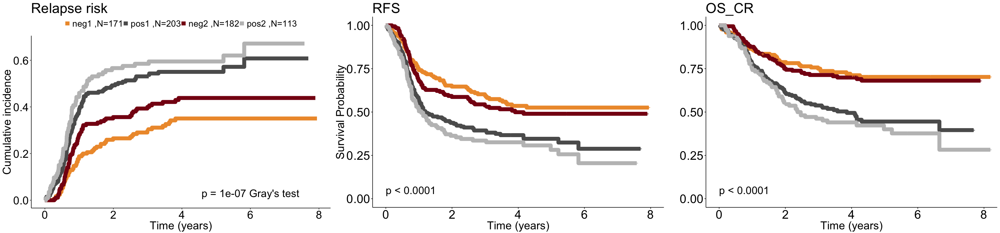

In [33]:
tmp <- df_merge_post_course
tmp$comparison <- ifelse(tmp$CR_MRD_neg_pc1==1,"neg1",
                         ifelse(tmp$CR_MRD_pos_pc1==1,"pos1","others"))
tmp1 <-  df_merge_post_course
tmp1$comparison <- ifelse(tmp$CR_MRD_neg_pc2==1,"neg2",
                         ifelse(tmp$CR_MRD_pos_pc2==1,"pos2","others"))
tmp <- rbind(tmp[tmp$comparison!="others",],tmp1[tmp1$comparison!="others",])
tmp$comparison <- factor(tmp$comparison,levels=c("neg1","pos1","neg2","pos2"))
p <- list()
for (i in 1:2){
    if (i==1){
        surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
    }  else {  
        surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)
        }
                    
                          
    fit <- survfit(surv_object ~ comparison, data = tmp)
    p[[i]] <- plot_surv_curves(fit,
                               y=ifelse(i==1,"Survival Probability",""),submain=ifelse(i==1,"RFS","OS_CR"),font.legend=16,vals = val,legend="none") 
}


tmp = dd_post_course
tmp$comparison <- ifelse(tmp$CR_MRD_neg_pc1==1,"neg1",
                         ifelse(tmp$CR_MRD_pos_pc1==1,"pos1","others"))
tmp1 = dd_post_course
tmp1$comparison <- ifelse(tmp$CR_MRD_neg_pc2==1,"neg2",
                         ifelse(tmp$CR_MRD_pos_pc2==1,"pos2","others"))
tmp <- rbind(tmp[tmp$comparison!="others",],tmp1[tmp1$comparison!="others",])
tmp$comparison <- factor(tmp$comparison,levels=c("neg1","pos1","neg2","pos2"))

cmfit = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
tlg = table(tmp$comparison[!is.na(tmp$comp_sample_years)])
myleg = paste0(" ", names(tlg)," ,N=",tlg,"")

cmfit.test = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
pval = cmfit.test$Tests["relapse","pv"]

cr <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=c("neg1","pos1","neg2","pos2"))+scale_color_manual(values=val,labels=myleg)+
theme(legend.key.width = unit(0.1,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
      plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=19))+
      theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,7),"Gray's test"),x=6,y=0.03,size=8)

grid.arrange(cr,p[[1]]$plot,p[[2]]$plot,nrow=1)

# POST COURSE 2 ANALYSIS

In [19]:
tmp <-read.table('../handovercompiled.Yanis.080919.csv',sep=",",header=T)
rownames(tmp) <- tmp$data_pd
cols_to_keep <- colnames(tmp)
master <- read.table('../../../../data/initial_dataset/Master_04_10_2019.csv',sep=",",header=T)
rownames(master) <- master$data_pd
df <- read.table('../../../clustering/clustering_Final_1/df_final_full_component.tsv')
df_merge <- merge(df,master[,c(cols_to_keep,"intense")],by=0)
rownames(df_merge) <- df_merge$Row.names
df_merge <- df_merge[-1]
df_merge$AMLID <- as.character(df_merge$AMLID)
df_merge$MRD2 <- as.character(df_merge$MRD2)
df_merge <- df_merge[grep("17-", df_merge$AMLID),]   ### keep only AML 17
df_merge$CR_MRD_neg <- ifelse(df_merge$MRD2=="CR,MRD-",1,0)
df_merge[is.na(df_merge$CR_MRD_neg),"CR_MRD_neg"] <- 0
df_merge$CR_MRD_pos <- ifelse(df_merge$MRD2=="CR,MRD+",1,0)
df_merge[is.na(df_merge$CR_MRD_pos),"CR_MRD_pos"] <- 0
df_merge$all_others <- ifelse((df_merge$CR_MRD_pos==0 & df_merge$CR_MRD_neg==0),1,0)
df_merge <- df_merge[!is.na(df_merge$OS_CR),]
df_merge <- df_merge[!is.na(df_merge$MRD1),]   ## we do it based on MRD1 to have exactly same patients in the comparison post course 1 vs post course 2 study!!!
df_merge <- df_merge[df_merge$os >0 & df_merge$OS_CR >0 & df_merge$RFSyears>0,]


genes <- colnames(df_merge[,c(5:88)])

cytos <- colnames(df_merge[,c(89:158)])

eln <- colnames(df_merge[,c(2,3,4)])
comp <- colnames(df_merge[,c(170:186)])

all_gen <- c(5:88)
vect <- apply(X=df_merge[,all_gen],2,FUN=function(x) 100*length(which(x==1))/dim(df_merge)[1])
gen <- colnames(df_merge[,match(names(vect[vect>=2]),names(df_merge))])

all_cyto <- c(89:158)
vect <- apply(X=df_merge[,all_cyto],2,FUN=function(x) 100*length(which(x==1))/dim(df_merge)[1])
cyto <- colnames(df_merge[,match(names(vect[vect>=2]),names(df_merge))])

clin <- colnames(df_merge[,c(159:165)])
demo <- colnames(df_merge[,c(166:167)])

val <- c("#EE9937","#5C5C5C","#870C14","#BFBFBF","#59A08B","#2b8cbe","#a6bddb","#fdbb84","#e79f00","#000000","darkseagreen","lightskyblue","#0072B2","pink","blue","green")

In [20]:
table(df_merge$all_others)


  0   1 
295 448 

# Cumulative Incidence Function

In [21]:
dd <- df_merge
dd$comp_sample_years = dd$RFSyears
dd$comp_status = "censor"
dd$comp_status[dd$RelapseCIStatus==1] = "relapse"
dd$comp_status[dd$RelapseCIStatus==2] = "death"
dd$comp_status = factor(dd$comp_status, levels=c("censor","relapse","death"))
table(dd$comp_status)


gg_competingrisks.cuminc <- function(fit, gnames = NULL, gsep=" ",
                                    coef = 1.96, conf.int = FALSE, line.size=4, group.levels=NULL,title="Relapse risk") {
    
  # -- fit is from cuminc --  #
  if (!is.null(fit$Tests))
    fit <- fit[names(fit) != "Tests"]
  fit2 <- lapply(fit, `[`, 1:3)
  if (is.null(gnames)) gnames <- names(fit2)
  fit2_list <- lapply(seq_along(gnames), function(ind) {
    df <- as.data.frame(fit2[[ind]])
    df$name <- gnames[ind]
    df
  })
  time <- est <- event <- group <- NULL
  df <- do.call(rbind, fit2_list)
  df$event <- sapply(strsplit(df$name, split=gsep), `[`, 2)
  df$group <- sapply(strsplit(df$name, split=gsep), `[`, 1)
  df$std <- std <- sqrt(df$var)
  if (!is.na(group.levels)) {
      df$group = factor(df$group, levels=group.levels)
  }

  df <- df[df$event=="relapse",]

  pl <-  ggplot(df, aes(time, est, color=group)) + geom_line(size=line.size,linetype=1) + ylab("Cumulative incidence") + xlab("Time (years)") + theme_survminer() + ggtitle(title)

  if (conf.int) {
    pl <- pl + geom_ribbon(aes(ymin = est - coef*std, ymax=est + coef*std, fill = event), alpha = 0.2, linetype=0)
  }

  return(pl)
}



 censor relapse   death 
    321     338      84 

# A few correlates

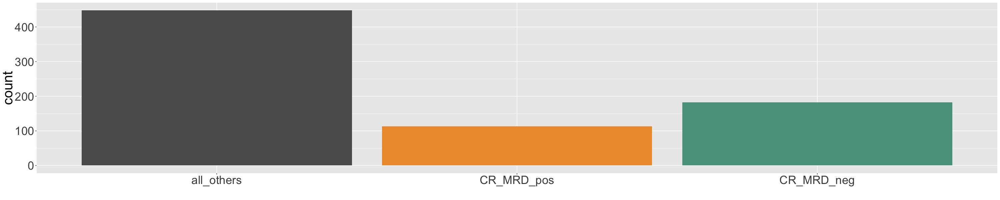

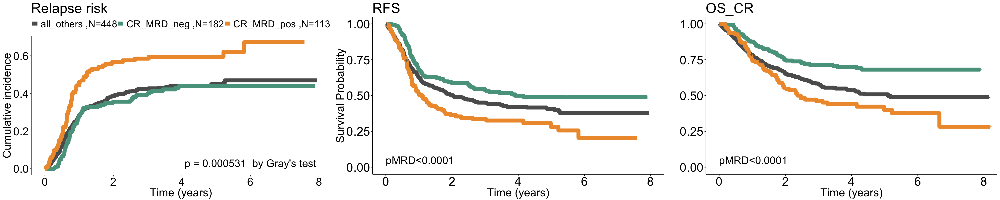

In [22]:
set_notebook_plot_size(30,6)
tmp<- df_merge
tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                        ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all_others"))

# RFS and OS
p <- list()
for (i in 1:2){
    if (i==1){
        res <- pairwise_survdiff(Surv(RFSyears,RFSStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
        surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
    }  else  {
        res <- pairwise_survdiff(Surv(OS_CR,DEADStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
        surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)
        }
                    
                          
    fit <- survfit(surv_object ~ comparison, data = tmp)
    p[[i]] <- plot_surv_curves(fit,pval=ifelse(round(res$p.value[1],4)==0,"pMRD<0.0001",paste("pMRD = ",round(res$p.value[1],4),sep="")),
                               y=ifelse(i==1,"Survival Probability",""),submain=ifelse(i==1,"RFS","OS_CR"),font.legend=16,vals = c("#5C5C5C","#59A08B","#EE9937"),legend="none") 
}
tmp$comparison <- factor(tmp$comparison,levels=c("all_others","CR_MRD_pos","CR_MRD_neg"))
ggplot(tmp,aes(x=comparison,fill=comparison))+geom_bar()+scale_fill_manual(values = c("#5C5C5C","#EE9937","#59A08B"))+guides(fill=F)+theme(axis.text=element_text(size=25),axis.title=element_text(size=30))+xlab("")

tmp = dd
tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                         ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all_others"))

cmfit = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
tlg = table(tmp$comparison[!is.na(tmp$comp_sample_years)])
myleg = paste0(" ", names(tlg)," ,N=",tlg,"")

cmfit.test = with(tmp,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
pval = cmfit.test$Tests["relapse","pv"]

cr <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=c("all_others","CR_MRD_neg","CR_MRD_pos"))+scale_color_manual(values=c("#5C5C5C","#59A08B","#EE9937"),labels=myleg)+
theme(legend.key.width = unit(0.5,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
      plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=21))+
      theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,6)," by Gray's test"),x=6,y=0.03,size=8)
grid.arrange(cr,p[[1]]$plot,p[[2]]$plot,nrow=1)



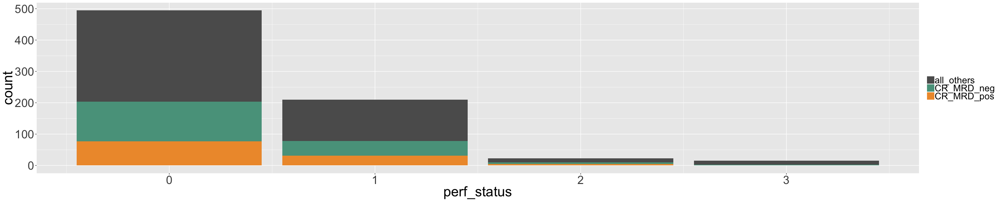

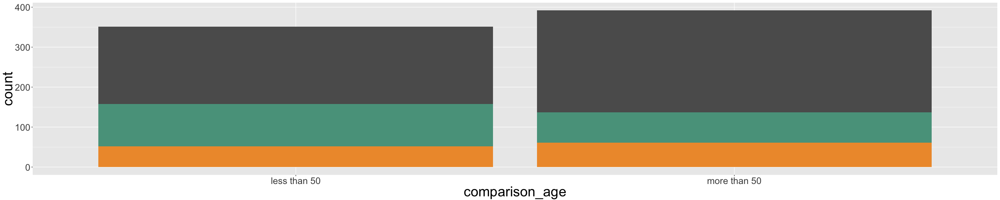

In [202]:
tmp<- df_merge
tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                        ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all_others"))

ggplot(tmp,aes(x=perf_status,fill=comparison))+geom_bar(stat="count")+scale_fill_manual(values = c("#5C5C5C","#59A08B","#EE9937"))+
theme(legend.text = element_text(size=20),axis.text=element_text(size=25),axis.title=element_text(size=30),legend.title=element_blank())

tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                        ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all_others"))
tmp$comparison_age <- ifelse(tmp$age<50,"less than 50","more than 50")


ggplot(tmp,aes(x=comparison_age,fill=comparison))+geom_bar(stat="count")+scale_fill_manual(values = c("#5C5C5C","#59A08B","#EE9937"))+guides(fill=F)+theme(axis.text=element_text(size=20),axis.title=element_text(size=30))

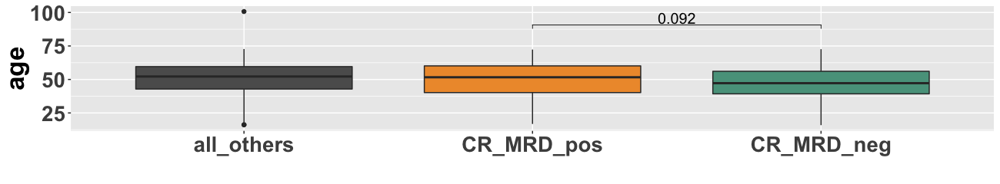

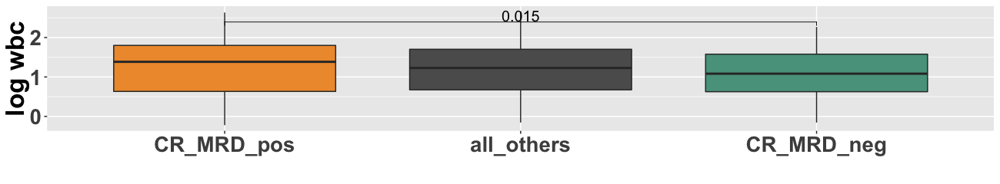

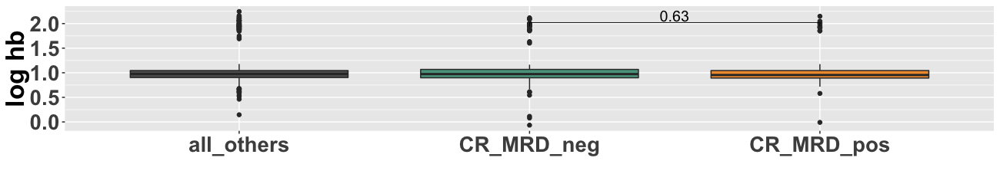

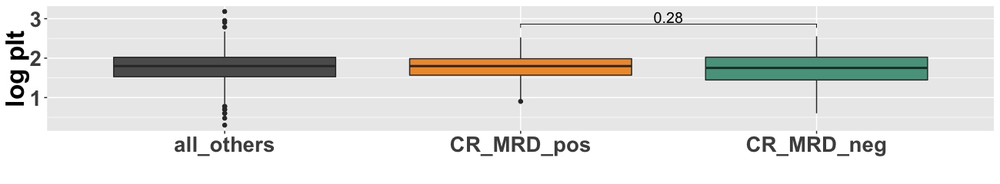

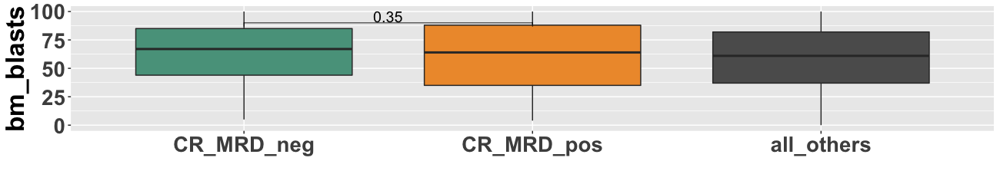

In [23]:
# c("gender","ahd","perf_status","secondary")
set_notebook_plot_size(13,2.4)
continuous_correlates=c("age","wbc","hb","plt","bm_blasts")
tmp<- df_merge
tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                        ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all_others"))


for (col in continuous_correlates){
    if (col %in% c("wbc","hb","plt")){    
        tmp[,col] <- log(tmp[,col],10)
    }
#     png(paste(col,"_clinical.png",sep=""),width=4500,height=2500,res=200)
    p[[col]] <- ggplot(tmp,aes(x=reorder(comparison,-tmp[,col],FUN=median),y=tmp[,col],fill=comparison)) +
    geom_boxplot() +
    ylab(ifelse(col %in% c("wbc","hb","plt"),paste("log",col),col))+xlab("")+theme(plot.title = element_text(hjust = 0.5,size=25),axis.text=element_text(size=20,face="bold"),axis.title=element_text(size=24,face="bold"))+
#     scale_y_continuous(limits = quantile(tmp[,col], c(0, 0.9999),na.rm = T))+
    scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+theme(legend.position = "none")+stat_compare_means(comparisons=list(c("CR_MRD_neg","CR_MRD_pos")),method="t.test",size=5,label.y=0.9*max(tmp[,col]))
    plot(p[[col]])
    
#     suppressWarnings(plot(p))
    }
       

# KM FOR ELN

In [24]:
set_notebook_plot_size(30,13)
p <- list()
cr <- list()
k <- 1
for (i in c(1:3)){
    if(i==1){
        tmp <- df_merge[df_merge$eln_2017_favorable==1,]
        tmp_cr <- dd[dd$eln_2017_favorable==1,]
        strat= "ELN Favorable"
        
    }else if(i==2){
        tmp <- df_merge[df_merge$eln_2017_intermediate==1,]
        tmp_cr <- dd[dd$eln_2017_intermediate==1,]
        strat= "ELN Intermediate"
    }else{
        tmp <- df_merge[df_merge$eln_2017_adverse==1,]
        tmp_cr <- dd[dd$eln_2017_adverse==1,]
        strat= "ELN Adverse"
    }
    tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                        ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all_others"))
    for (j in 1:2){
        if (j==1){
            res <- pairwise_survdiff(Surv(RFSyears,RFSStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
            surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
        }  else  {
            res <- pairwise_survdiff(Surv(OS_CR,DEADStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
            surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)            

        }
        fit <- survfit(surv_object ~ comparison, data = tmp)
        p[[k]] <- plot_surv_curves(fit,pval=ifelse(round(res$p.value[1],4)==0,"pMRD<0.0001",paste("pMRD = ",round(res$p.value[1],4),sep="")),
                                     y=ifelse(k %in% c(1,3,5),"Survival Probability",""),submain=paste(ifelse(j==1,"RFS ","OS_CR "),strat,sep=""),font.legend=20,vals = c("#5C5C5C","#59A08B","#EE9937"),legend="none")
        
        
    tmp_cr$comparison <- ifelse(tmp_cr$CR_MRD_neg==1,"CR_MRD_neg",
                     ifelse(tmp_cr$CR_MRD_pos==1,"CR_MRD_pos","all_others"))

    cmfit = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    tlg = table(tmp_cr$comparison[!is.na(tmp_cr$comp_sample_years)])
    myleg = paste0(" ", names(tlg)," ,N=",tlg,"")

    cmfit.test = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    pval = cmfit.test$Tests["relapse","pv"]

    cr[[i]] <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=c("all_others","CR_MRD_neg","CR_MRD_pos"),title=paste("Relative risk for ",strat,sep=""))+scale_color_manual(values=c("#5C5C5C","#59A08B","#EE9937"),labels=myleg)+
    theme(legend.key.width = unit(0.5,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
          plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=20))+
          theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,6),"Gray's test"),x=6,y=0.03,size=8)
    k <- k+1
    }
}

png("eln_curves_pc2.png",width=7500,height=3050,res=250)
grid.arrange(cr[[1]],p[[1]]$plot,p[[2]]$plot,cr[[2]],p[[3]]$plot,p[[4]]$plot,cr[[3]],p[[5]]$plot,p[[6]]$plot,ncol=3)
dev.off()

pdf 
  2

# II) Significant MRD Effects 


# 1) Genes and Cytos

In [36]:
table(df_merge$ITD,df_merge$NPM1)

   
      0   1
  0 403 179
  1  52 109

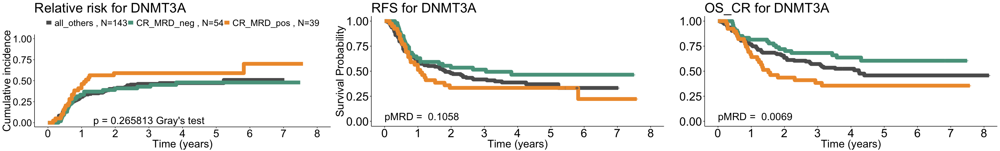

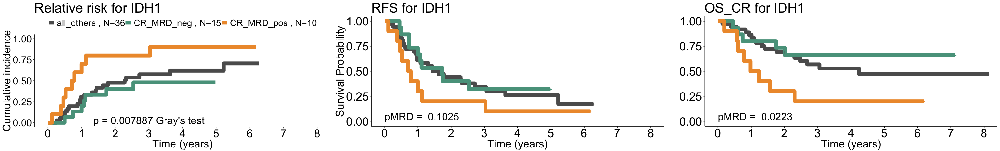

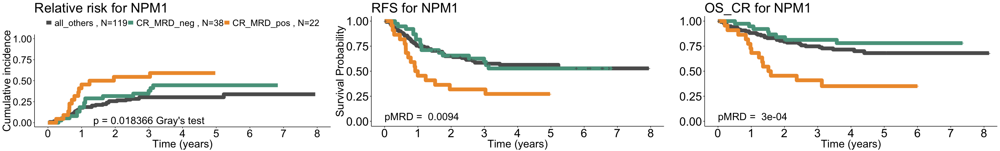

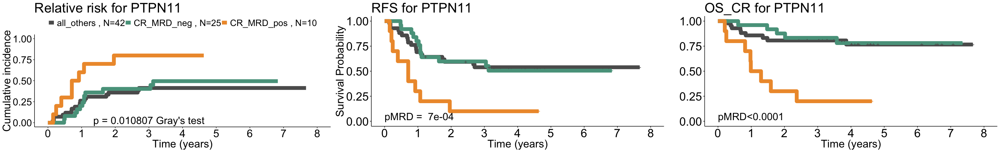

In [46]:
# special ones

set_notebook_plot_size(31,4.7)
for(event in c("DNMT3A","IDH1","NPM1","PTPN11")){
    if(event=="NPM1"){
        tmp <- df_merge[df_merge[,event]==1 & df_merge$ITD==0,]
    }else{
        tmp<- df_merge[df_merge[,event]==1,]
    }
    
        
    if(nrow(tmp[tmp$CR_MRD_neg==1,])>=7 & nrow(tmp[tmp$CR_MRD_pos==1,])>=7){
        tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                            ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all others"))
        for (i in 1:2){
            if (i==1){
                res <- pairwise_survdiff(Surv(RFSyears,RFSStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
                surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
            }  else  {
                res <- pairwise_survdiff(Surv(OS_CR,DEADStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
                surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)

                }


            fit <- survfit(surv_object ~ comparison, data = tmp)
            p[[i]] <- plot_surv_curves(fit,y=ifelse(i==1,"Survival Probability",""),submain=paste(ifelse(i==1,"RFS for ","OS_CR for "),event,sep=""),font.legend=20,vals = c("#5C5C5C","#59A08B","#EE9937"),
                                      pval=ifelse(round(res$p.value[1],4)==0,"pMRD<0.0001",paste("pMRD = ",round(res$p.value[1],4))),legend="none",xlim=c(0,8),break.x.by=1)
        }
    if(event=="NPM1"){  
        tmp_cr <- dd[dd[,event]==1 & dd$ITD==0,]
    } else{
        tmp_cr <- dd[dd[,event]==1,]
    }
    tmp_cr$comparison <- ifelse(tmp_cr$CR_MRD_neg==1,"CR_MRD_neg",
                            ifelse(tmp_cr$CR_MRD_pos==1 ,"CR_MRD_pos","all_others"))

    cmfit = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    tlg = table(tmp_cr$comparison[!is.na(tmp_cr$comp_sample_years)])
    myleg = paste0(" ", names(tlg)," , N=",tlg,"")

    cmfit.test = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    pval = cmfit.test$Tests["relapse","pv"]

    cr <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=names(tlg),title=paste("Relative risk for",event))+
    scale_color_manual(values=c("#5C5C5C","#59A08B","#EE9937"),labels=myleg)+
    theme(legend.key.width = unit(0.5,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
          plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=20))+
          theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,6),"Gray's test"),x=3,y=0.03,size=8)+ylim(c(0,1))+scale_x_continuous(limits=c(0,8),breaks=0:8)
        
    grid.arrange(cr,p[[1]]$plot,p[[2]]$plot,nrow=1)
    }
}



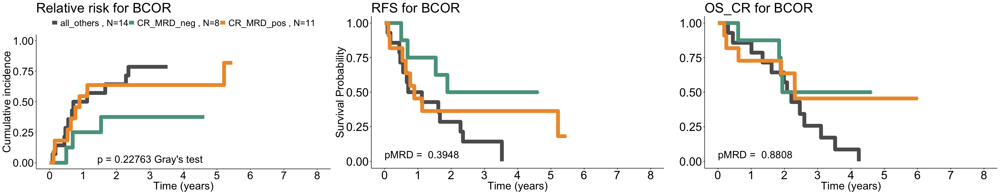

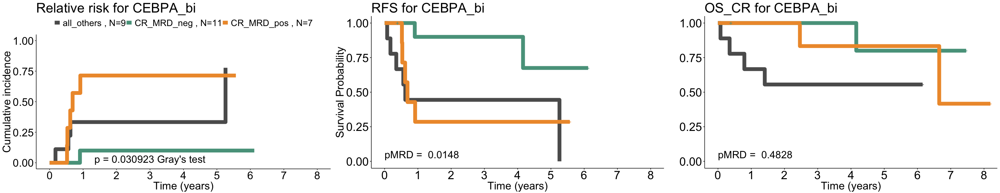

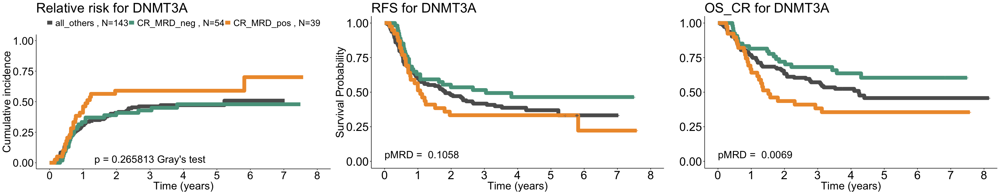

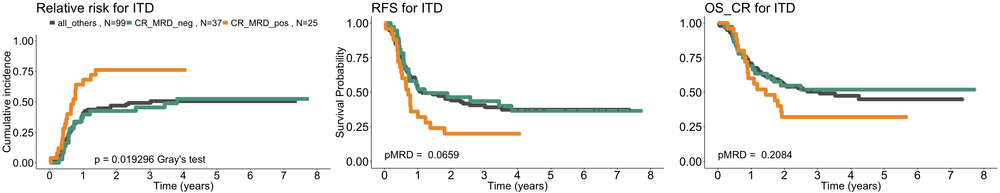

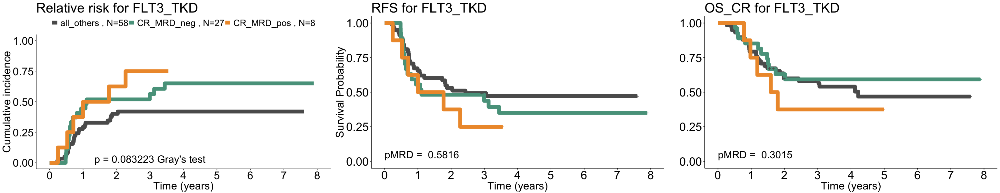

...

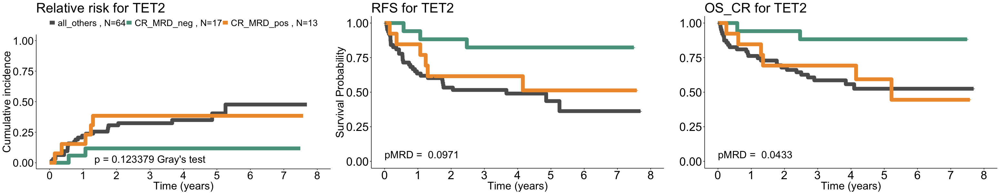

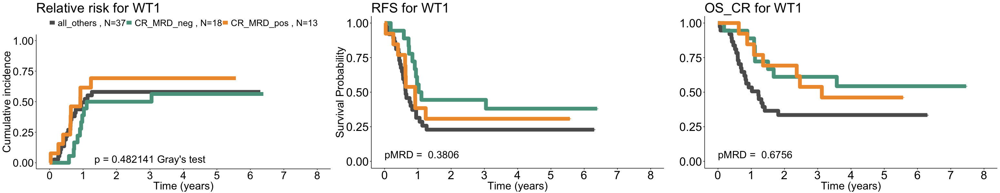

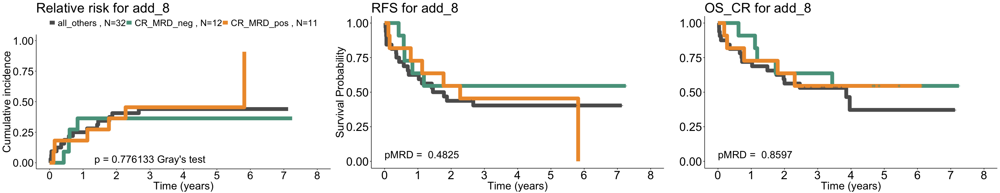

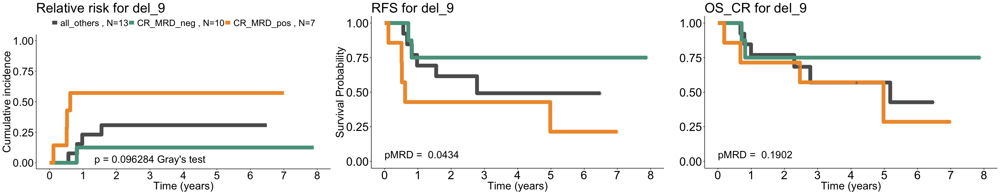

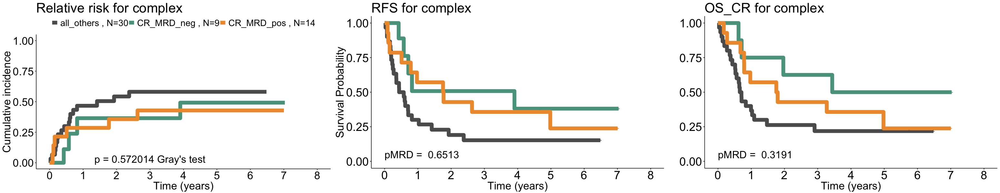

In [26]:
set_notebook_plot_size(31,6)
# for (event in c("ITD","NRAS_p.G12_13")){
for(event in c(genes,cytos)){
# for(event in c("IDH1","PTPN11")){
    tmp<- df_merge[df_merge[,event]==1,]
    if(nrow(tmp[tmp$CR_MRD_neg==1,])>=7 & nrow(tmp[tmp$CR_MRD_pos==1,])>=7){
        tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                            ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all others"))
        for (i in 1:2){
            if (i==1){
                res <- pairwise_survdiff(Surv(RFSyears,RFSStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
                surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
            }  else  {
                res <- pairwise_survdiff(Surv(OS_CR,DEADStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
                surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)

                }


            fit <- survfit(surv_object ~ comparison, data = tmp)
            p[[i]] <- plot_surv_curves(fit,y=ifelse(i==1,"Survival Probability",""),submain=paste(ifelse(i==1,"RFS for ","OS_CR for "),event,sep=""),font.legend=20,vals = c("#5C5C5C","#59A08B","#EE9937"),
                                      pval=ifelse(round(res$p.value[1],4)==0,"pMRD<0.0001",paste("pMRD = ",round(res$p.value[1],4))),legend="none",xlim=c(0,8),break.x.by=1)
        }
        
    tmp_cr <- dd[dd[,event]==1,]
    tmp_cr$comparison <- ifelse(tmp_cr$CR_MRD_neg==1,"CR_MRD_neg",
                            ifelse(tmp_cr$CR_MRD_pos==1 ,"CR_MRD_pos","all_others"))

    cmfit = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    tlg = table(tmp_cr$comparison[!is.na(tmp_cr$comp_sample_years)])
    myleg = paste0(" ", names(tlg)," , N=",tlg,"")

    cmfit.test = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    pval = cmfit.test$Tests["relapse","pv"]

    cr <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=names(tlg),title=paste("Relative risk for",event))+
    scale_color_manual(values=c("#5C5C5C","#59A08B","#EE9937"),labels=myleg)+
    theme(legend.key.width = unit(0.5,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
          plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=20))+
          theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,6),"Gray's test"),x=3,y=0.03,size=8)+ylim(c(0,1))+scale_x_continuous(limits=c(0,8),breaks=0:8)
        
    grid.arrange(cr,p[[1]]$plot,p[[2]]$plot,nrow=1)
    }
}



# 2) Components

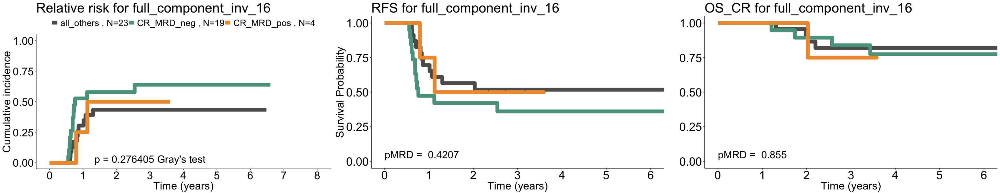

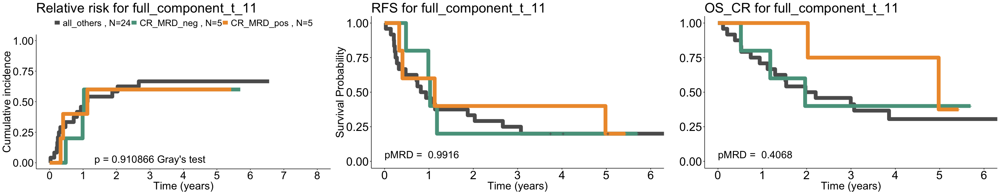

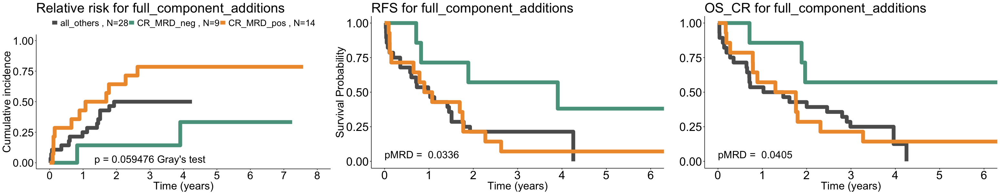

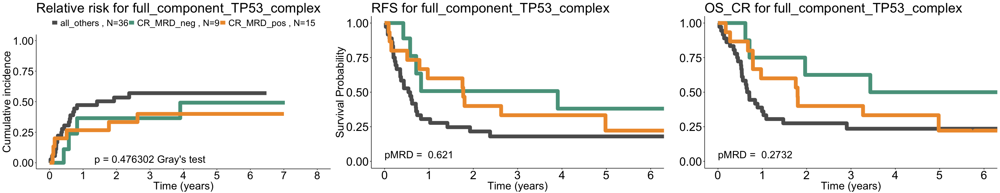

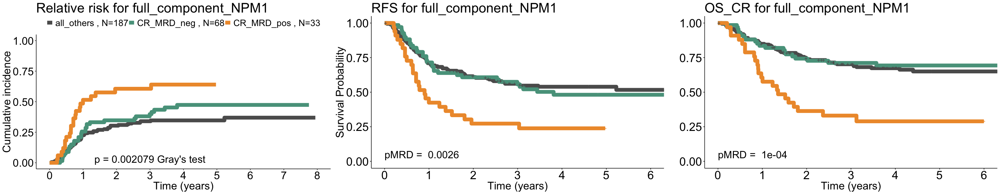

...

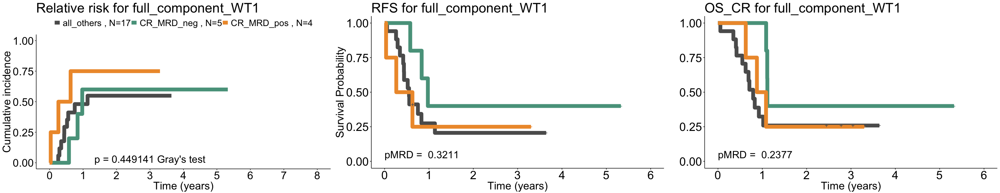

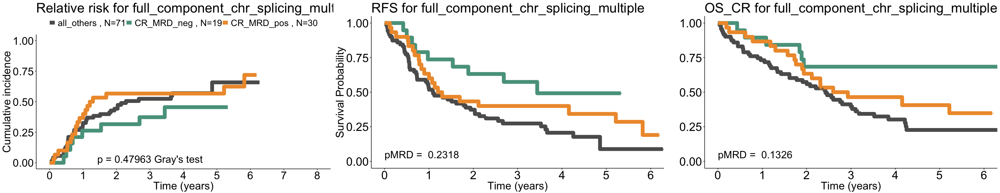

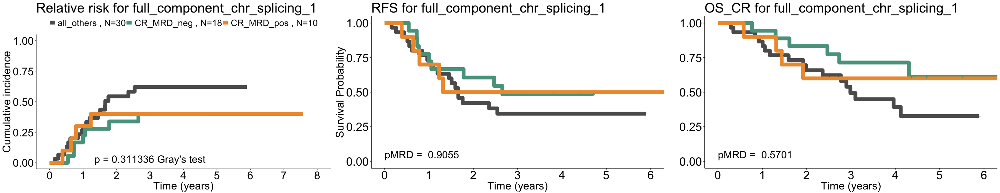

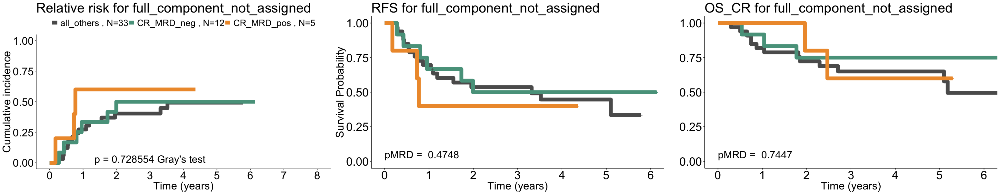

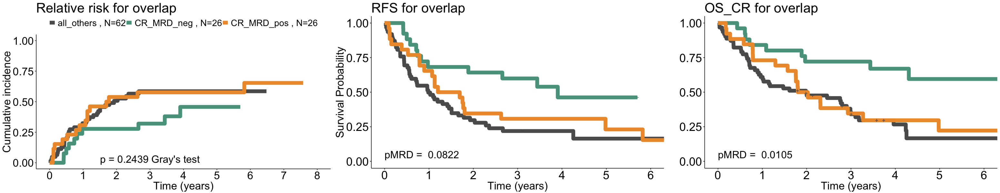

In [27]:
set_notebook_plot_size(31,6)
for (event in comp){
    tmp<- df_merge[df_merge[,event]==1,]
    if(nrow(tmp[tmp$CR_MRD_neg==1,])>=4 & nrow(tmp[tmp$CR_MRD_pos==1,])>=4){
        tmp$comparison <- ifelse(tmp$CR_MRD_neg==1,"CR_MRD_neg",
                            ifelse(tmp$CR_MRD_pos==1,"CR_MRD_pos","all others"))
        for (i in 1:2){
            if (i==1){
                res <- pairwise_survdiff(Surv(RFSyears,RFSStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
                surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
            }  else  {
                res <- pairwise_survdiff(Surv(OS_CR,DEADStatus)~comparison,data = tmp[tmp$comparison %in% c("CR_MRD_neg","CR_MRD_pos"),])
                surv_object <- Surv(time = tmp$OS_CR, event = tmp$DEADStatus)

                }


            fit <- survfit(surv_object ~ comparison, data = tmp)
            p[[i]] <- plot_surv_curves(fit,y=ifelse(i==1,"Survival Probability",""),submain=paste(ifelse(i==1,"RFS for ","OS_CR for "),event,sep=""),font.legend=20,vals = c("#5C5C5C","#59A08B","#EE9937"),
                                      pval=ifelse(round(res$p.value[1],4)==0,"pMRD<0.0001",paste("pMRD = ",round(res$p.value[1],4))),legend="none",xlim=c(0,6),break.x.by=1)
        }
        
    tmp_cr <- dd[dd[,event]==1,]
    tmp_cr$comparison <- ifelse(tmp_cr$CR_MRD_neg==1,"CR_MRD_neg",
                            ifelse(tmp_cr$CR_MRD_pos==1 ,"CR_MRD_pos","all_others"))

    cmfit = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    tlg = table(tmp_cr$comparison[!is.na(tmp_cr$comp_sample_years)])
    myleg = paste0(" ", names(tlg)," , N=",tlg,"")

    cmfit.test = with(tmp_cr,cuminc(comp_sample_years,comp_status,comparison,cencode="censor"))
    pval = cmfit.test$Tests["relapse","pv"]

    cr <- gg_competingrisks.cuminc(cmfit,line.size=4,group.levels=names(tlg),title=paste("Relative risk for",event))+
    scale_color_manual(values=c("#5C5C5C","#59A08B","#EE9937"),labels=myleg)+
    theme(legend.key.width = unit(0.5,"cm"),axis.text.y=element_text(size=24),axis.text.x=element_text(size=24),axis.title.x = element_text(size=24),axis.title.y = element_text(size=24),
          plot.title = element_text(size=30),legend.title = element_text(size=20),legend.text = element_text(size=20))+
          theme(legend.title = element_blank())+annotate("text",label=paste("p","=",round(pval,6),"Gray's test"),x=3,y=0.03,size=8)+scale_x_continuous(limits=c(0,8),breaks=0:8)+ylim(c(0,1))
        
    grid.arrange(cr,p[[1]]$plot,p[[2]]$plot,nrow=1)
    }
}



# STACKED FREQUENCY PROP GENE CYTO

ERROR while rich displaying an object: Error in FUN(X[[i]], ...): object 'MRD_status' not found

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. repr::mime2repr[[mime]](obj)
8. repr_text.default(obj)
9. pas

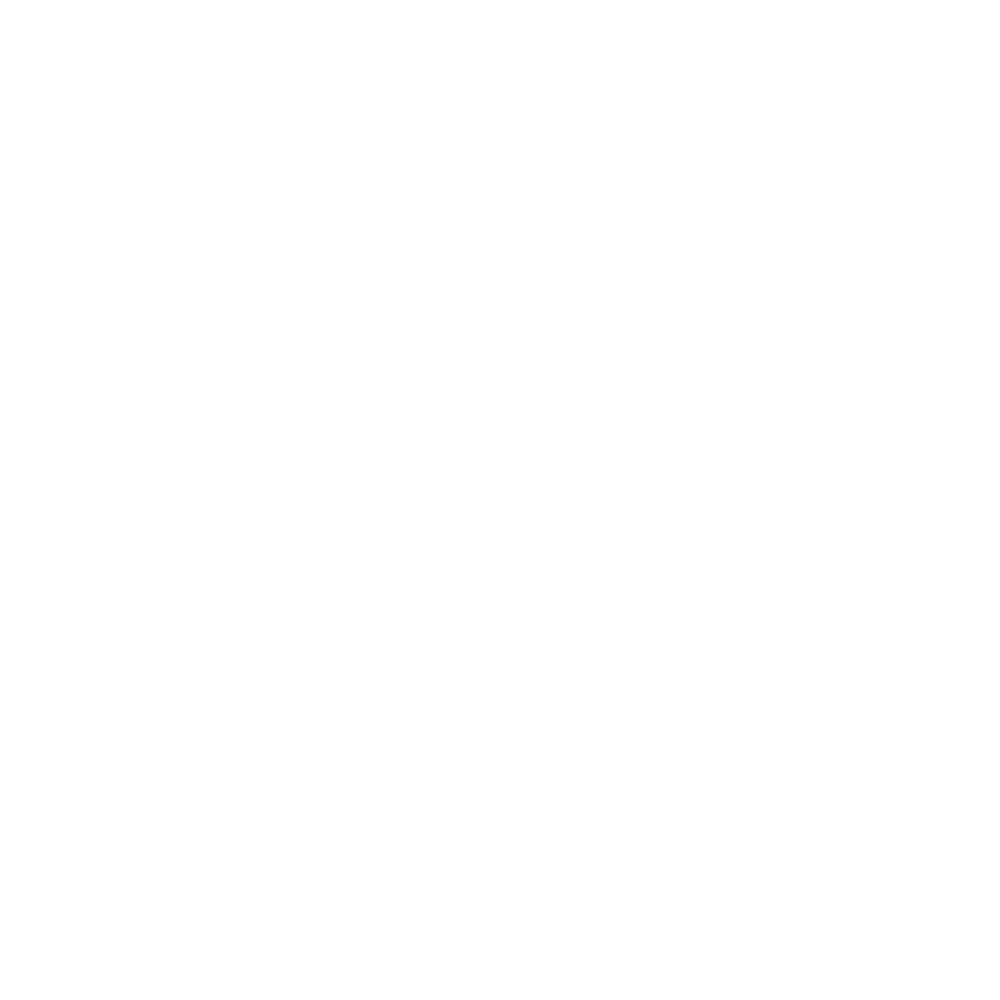

In [49]:
tmp <- NULL
for (co in c("eln_2017_adverse","eln_2017_intermediate","eln_2017_favorable")){
    if(nrow(df_merge[df_merge[,co]==1,])>0){
        tmp1 <- df_merge[df_merge[,co]==1,]
        tmp1$components <- co
        tmp <- rbind(tmp,tmp1)
    }
}
s <- ggplot(tmp,aes(x=reorder(components,components,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes( y=..count../tapply(..count.., ..x.. ,sum)[..x..],fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=35,face="bold",angle=90,hjust=1),axis.text.y = element_text(size=35,face="bold"),
      axis.title.y=element_text(size=50,face="bold"),legend.text=element_text(size=30),legend.title=element_text(size=25))+xlab("")+ylab("Proportion")+ggtitle("Components")
set_notebook_plot_size(10,10)
s

ERROR while rich displaying an object: Error in FUN(X[[i]], ...): object 'MRD_status' not found

Traceback:
1. FUN(X[[i]], ...)
2. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
3. tryCatchList(expr, classes, parentenv, handlers)
4. tryCatchOne(expr, names, parentenv, handlers[[1L]])
5. doTryCatch(return(expr), name, parentenv, handler)
6. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
7. repr::mime2repr[[mime]](obj)
8. repr_text.default(obj)
9. pas

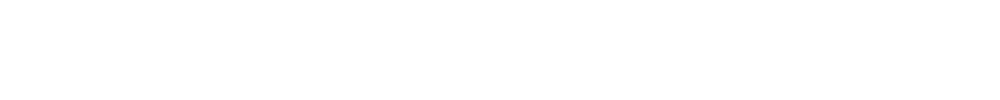

In [17]:
tmp <- NULL
for (co in c(genes,cytos)){
    if(nrow(df_merge[df_merge[,co]==1,])>0){
        tmp1 <- df_merge[df_merge[,co]==1,]
        tmp1$components <- co
        tmp <- rbind(tmp,tmp1)
    }
}
s <- ggplot(tmp,aes(x=reorder(components,components,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes( y=..count../tapply(..count.., ..x.. ,sum)[..x..],fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=35,face="bold",angle=90,hjust=1),axis.text.y = element_text(size=35,face="bold"),
      axis.title.y=element_text(size=50,face="bold"),legend.text=element_text(size=30),legend.title=element_text(size=25))+xlab("")+ylab("Proportion")+ggtitle("Components")
set_notebook_plot_size(100,10)
s

# STACKED FREQUENCY PROP COMP

In [145]:
tmp <- NULL    
library(dplyr)
library(tidyr)
for (co in comp){
    tmp1 <- df_merge[df_merge[,co]==1,]
    tmp1$components <- str_replace(co,"full_component_","")
    tmp <- rbind(tmp,tmp1)
}
s <- ggplot(tmp,aes(x=reorder(components,components,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes( y=..count../tapply(..count.., ..x.. ,sum)[..x..],fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=35,face="bold",angle=90,hjust=1),axis.text.y = element_text(size=35,face="bold"),
      axis.title.y=element_text(size=50,face="bold"),legend.text=element_text(size=30),legend.title=element_text(size=25))+xlab("")+ylab("Proportion")+ggtitle("Components")

# png("MRD_stacked_prop.png",width=5000,height=5000,res=250) 
s
# dev.off()

pdf 
  2

# CORRELATES FOR MRD

In [96]:

tmp <- df_merge
tmp$eln_2017 <- ifelse(df_merge$eln_2017==1,"adverse",
                           ifelse(df_merge$eln_2017==2,"intermediate","favorable"))
p <- ggplot(tmp,aes(x=reorder(eln_2017,eln_2017,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes(fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=20,face="bold"),axis.text.y = element_text(size=20,face="bold"),
      axis.title.y=element_text(size=30,face="bold"),legend.text=element_text(size=25),legend.title=element_text(size=25),legend.position="top")+xlab("")+ylab("Count")+ggtitle("ELN")

tmp <- df_merge
tmp$perf_status <- factor(tmp$perf_status)
tmp$eln_2017 <- ifelse(df_merge$eln_2017==1,"adverse",
                           ifelse(df_merge$eln_2017==2,"intermediate","favorable"))
q <- ggplot(tmp,aes(x=reorder(perf_status,perf_status,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes(fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=20,face="bold"),axis.text.y = element_text(size=20,face="bold"),
      axis.title.y=element_text(size=30,face="bold"),legend.text=element_text(size=25),legend.title=element_text(size=25),legend.position="none")+xlab("")+ylab("Count")+ggtitle("Perf status")

tmp <- df_merge
tmp$age_comparison <- ifelse(tmp$age<=50,"less than 50","more than 50")

r <- ggplot(tmp,aes(x=reorder(age_comparison,age_comparison,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes(fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=20,face="bold"),axis.text.y = element_text(size=20,face="bold"),
      axis.title.y=element_text(size=30,face="bold"),legend.text=element_text(size=25),legend.title=element_text(size=25),legend.position="none")+xlab("")+ylab("Count")+ggtitle("Age stratified at 50 (median)")

tmp <- NULL                         
for (co in comp){
    tmp1 <- df_merge[df_merge[,co]==1,]
    tmp1$components <- str_replace(co,"full_component_","")
    tmp <- rbind(tmp,tmp1)
}

s <- ggplot(tmp,aes(x=reorder(components,components,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes(fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=20,face="bold",angle=90,hjust=1),axis.text.y = element_text(size=20,face="bold"),
      axis.title.y=element_text(size=30,face="bold"),legend.text=element_text(size=25),legend.title=element_text(size=25),legend.position="none")+xlab("")+ylab("Count")+ggtitle("Components")
                              
png("stratification_MRD.png",width=5000,height=5000,res=250)
grid.arrange(s,nrow=1)
dev.off()

pdf 
  2

# STRAT BY COMP

In [97]:
options(warn=-1)
set_notebook_plot_size(30,10)
comp <- colnames(df_merge[,170:186])
# pdf("graphs/MRD/components_MRD.pdf",22,6)
for (ev in comp){
    png(paste(ev,"_MRD.png",sep=""),width=7000,height=2500,res=250)
    tmp<- df_merge[df_merge[,ev]==1,]
    surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
    fit <- survfit(surv_object ~ MRD_status, data = tmp)
    try(suppressWarnings(plots_KM_MRD(tmp=tmp,fit=fit,strat=str_replace(ev,"full_component_",""),leg.labs=c(paste("_others",nrow(tmp[(tmp$MRD_status=="_others") & !is.na(tmp$OS_CR),]),sep=", n="),
                                                     paste("CR,MRD-",nrow(tmp[(tmp$MRD_status=="CR,MRD-") & !is.na(tmp$OS_CR),]),sep=", n="),paste("CR,MRD+",nrow(tmp[(tmp$MRD_status=="CR,MRD+") & !is.na(tmp$OS_CR),]),sep=", n=")))))
    dev.off()
    }

Error in ggsurvplot_df(d, fun = fun, color = color, palette = palette,  : 
  The length of legend.labs should be 1
Error in ggsurvplot_df(d, fun = fun, color = color, palette = palette,  : 
  The length of legend.labs should be 1
Error in ggsurvplot_df(d, fun = fun, color = color, palette = palette,  : 
  The length of legend.labs should be 2
Error in ggsurvplot_df(d, fun = fun, color = color, palette = palette,  : 
  The length of legend.labs should be 1


# STRAT BY GENE AND CYTO

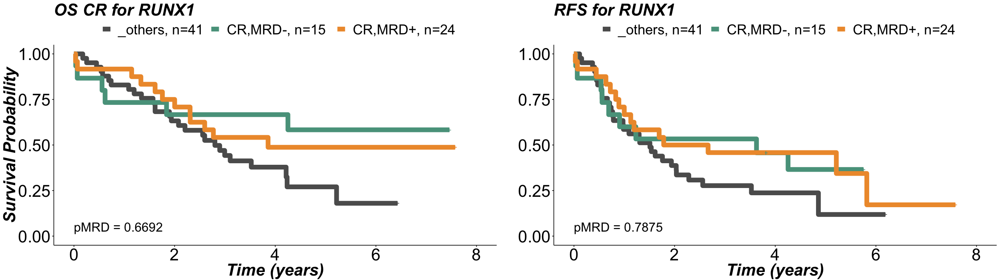

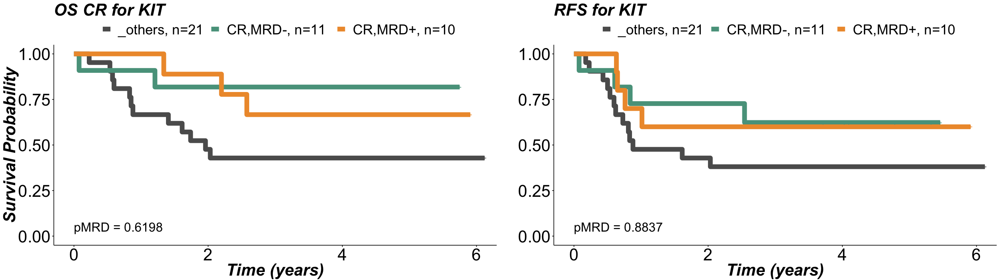

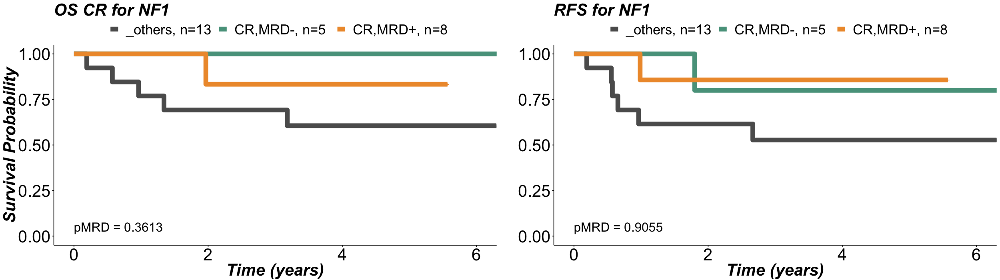

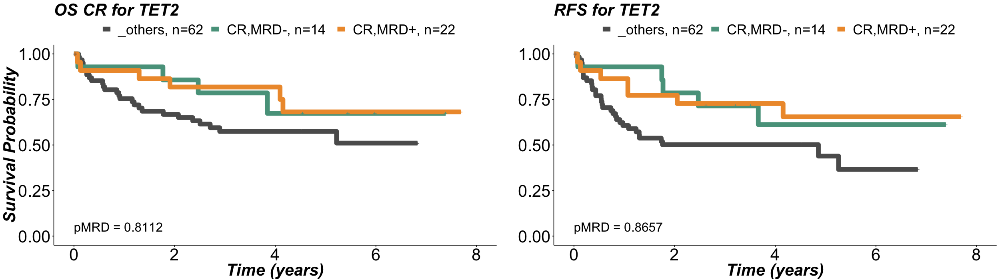

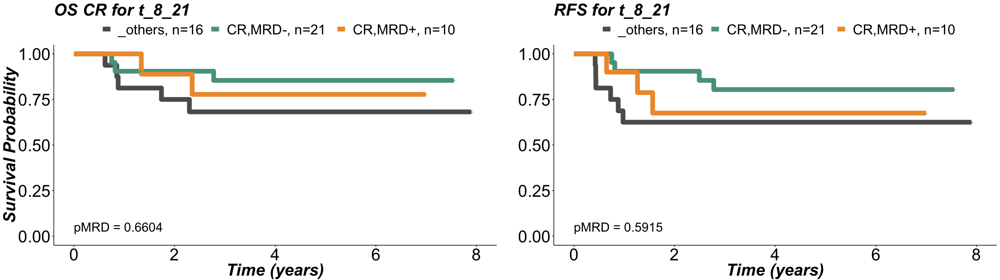

In [227]:
gene_cyto <- colnames(df_merge[,c(5:158)])
gene_cyto <-c("RUNX1","KIT","NF1","TET2","t_8_21")
# pdf("graphs/MRD/gene_cyto_MRD.pdf",22,6)

set_notebook_plot_size(25,7)
for (event in gene_cyto){
    tmp<- df_merge[df_merge[,event]==1,]
    surv_object <- Surv(time = tmp$RFSyears, event = tmp$RFSStatus)
    fit <- survfit(surv_object ~ MRD_status, data = tmp)
    p[[event]] <- try(suppressWarnings(plots_KM_MRD(tmp=tmp,fit=fit,strat=event,leg.labs=c(paste("_others",nrow(tmp[(tmp$MRD_status=="_others") & !is.na(tmp$OS_CR),]),sep=", n="),
                                                     paste("CR,MRD-",nrow(tmp[(tmp$MRD_status=="CR,MRD-") & !is.na(tmp$OS_CR),]),sep=", n="),paste("CR,MRD+",nrow(tmp[(tmp$MRD_status=="CR,MRD+") & !is.na(tmp$OS_CR),]),sep=", n=")))))
    }
# dev.off()

In [244]:
png("MRD_pos.png",width=5000,height=5000,res=200)
grid.arrange(p$RUNX1,p$KIT,p$NF1,p$TET2,p$t_8_21,nrow=5)
dev.off()

pdf 
  2

# END

In [47]:
tmp <- NULL    
library(dplyr)
library(tidyr)
for (co in comp[comp!="full_component_t_15_17"]){
    tmp1 <- df_merge[df_merge[,co]==1,]
    tmp1$components <- str_replace(co,"full_component_","")
    tmp <- rbind(tmp,tmp1)
}
tmp$MRD_status <- ifelse(tmp$CR_MRD_neg==1,"CR,MRD-",
                        ifelse(tmp$CR_MRD_pos==1,"CR,MRD+","all_others"))
s <- ggplot(tmp,aes(x=reorder(components,components,function(x) -length(x)),fill=MRD_status))+ geom_bar(aes( y=..count../tapply(..count.., ..x.. ,sum)[..x..],fill=MRD_status)) + scale_fill_manual(values=c("#5C5C5C","#59A08B","#EE9937"))+
theme(plot.title = element_text(hjust = 0.5,size=40,face="bold"),axis.text.x = element_text(size=35,face="bold",angle=90,hjust=1),axis.text.y = element_text(size=35,face="bold"),
      axis.title.y=element_text(size=50,face="bold"),legend.text=element_text(size=30),legend.title=element_text(size=25))+xlab("")+ylab("Proportion")+ggtitle("Components")

png("MRD_stacked_prop_pc2.png",width=5000,height=5000,res=250) 
s
dev.off()

pdf 
  2